## User Over view analysis for a TellCo

### Importing libraries

In [1]:
import os
import sys
sys.path.append(os.path.abspath(os.path.join('../scripts')))
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px




### Ignoring warnings


In [2]:
import warnings
warnings.filterwarnings('ignore')


In [3]:
import numpy as np
import pandas as pd
from helper import TelecomHelper
from clean_telecom_df import CleanTelecomData


### we will use this path to read or csv data


In [4]:

CSV_PATH = "../data/data.csv"

In [5]:
# this helper class has utility function we are going to use
Helper = TelecomHelper()

In [6]:
# we use our helper function to read csv data
# we treate values like 'n/a', 'na', 'undefined' as missing values

df = Helper.read_csv(CSV_PATH, missing_values=["n/a", "na", "undefined"])

file read as csv


In [7]:
pd.set_option('max_column', None)
pd.options.display.float_format = "{:.6f}".format


#### looking to our dataframe

In [8]:
df.head()


,Bearer Id,Start,Start ms,End,End ms,Dur. (ms),IMSI,MSISDN/Number,IMEI,Last Location Name,Avg RTT DL (ms),Avg RTT UL (ms),Avg Bearer TP DL (kbps),Avg Bearer TP UL (kbps),TCP DL Retrans. Vol (Bytes),TCP UL Retrans. Vol (Bytes),DL TP < 50 Kbps (%),50 Kbps < DL TP < 250 Kbps (%),250 Kbps < DL TP < 1 Mbps (%),DL TP > 1 Mbps (%),UL TP < 10 Kbps (%),10 Kbps < UL TP < 50 Kbps (%),50 Kbps < UL TP < 300 Kbps (%),UL TP > 300 Kbps (%),HTTP DL (Bytes),HTTP UL (Bytes),Activity Duration DL (ms),Activity Duration UL (ms),Dur. (ms).1,Handset Manufacturer,Handset Type,Nb of sec with 125000B < Vol DL,Nb of sec with 1250B < Vol UL < 6250B,Nb of sec with 31250B < Vol DL < 125000B,Nb of sec with 37500B < Vol UL,Nb of sec with 6250B < Vol DL < 31250B,Nb of sec with 6250B < Vol UL < 37500B,Nb of sec with Vol DL < 6250B,Nb of sec with Vol UL < 1250B,Social Media DL (Bytes),Social Media UL (Bytes),Google DL (Bytes),Google UL (Bytes),Email DL (Bytes),Email UL (Bytes),Youtube DL (Bytes),Youtube UL (Bytes),Netflix DL (Bytes),Netflix UL (Bytes),Gaming DL (Bytes),Gaming UL (Bytes),Other DL (Bytes),Other UL (Bytes),Total UL (Bytes),Total DL (Bytes)
0,13114483460844900352.000000,4/4/2019 12:01,770.000000,4/25/2019 14:35,662.000000,1823652.000000,208201448079117.000000,33664962239.000000,35521209507511.000000,9.16456699548519E+015,42.000000,5.000000,23.000000,44.000000,NaN,NaN,100.000000,0.000000,0.000000,0.000000,100.000000,0.000000,0.000000,0.000000,NaN,NaN,37624.000000,38787.000000,1823652892.000000,Samsung,Samsung Galaxy A5 Sm-A520F,NaN,NaN,NaN,NaN,NaN,NaN,213.000000,214.000000,1545765.000000,24420.000000,1634479.000000,1271433.000000,3563542.000000,137762.000000,15854611.000000,2501332.000000,8198936.000000,9656251.000000,278082303.000000,14344150.000000,171744450.000000,8814393.000000,36749741.000000,308879636.000000
1,13114483482878900224.000000,4/9/2019 13:04,235.000000,4/25/2019 8:15,606.000000,1365104.000000,208201909211140.000000,33681854413.000000,35794009006359.000000,L77566A,65.000000,5.000000,16.000000,26.000000,NaN,NaN,100.000000,0.000000,0.000000,0.000000,100.000000,0.000000,0.000000,0.000000,NaN,NaN,168.000000,3560.000000,1365104371.000000,Samsung,Samsung Galaxy J5 (Sm-J530),NaN,NaN,NaN,NaN,NaN,NaN,971.000000,1022.000000,1926113.000000,7165.000000,3493924.000000,920172.000000,629046.000000,308339.000000,20247395.000000,19111729.000000,18338413.000000,17227132.000000,608750074.000000,1170709.000000,526904238.000000,15055145.000000,53800391.000000,653384965.000000
2,13114483484080500736.000000,4/9/2019 17:42,1.000000,4/25/2019 11:58,652.000000,1361762.000000,208200314458056.000000,33760627129.000000,35281510359387.000000,D42335A,NaN,NaN,6.000000,9.000000,NaN,NaN,100.000000,0.000000,0.000000,0.000000,100.000000,0.000000,0.000000,0.000000,NaN,NaN,0.000000,0.000000,1361762651.000000,Samsung,Samsung Galaxy A8 (2018),NaN,NaN,NaN,NaN,NaN,NaN,751.000000,695.000000,1684053.000000,42224.000000,8535055.000000,1694064.000000,2690151.000000,672973.000000,19725661.000000,14699576.000000,17587794.000000,6163408.000000,229584621.000000,395630.000000,410692588.000000,4215763.000000,27883638.000000,279807335.000000
3,13114483485442799616.000000,4/10/2019 0:31,486.000000,4/25/2019 7:36,171.000000,1321509.000000,208201402342131.000000,33750343200.000000,35356610164913.000000,T21824A,NaN,NaN,44.000000,44.000000,NaN,NaN,100.000000,0.000000,0.000000,0.000000,100.000000,0.000000,0.000000,0.000000,NaN,NaN,3330.000000,37882.000000,1321509685.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.000000,207.000000,644121.000000,13372.000000,9023734.000000,2788027.000000,1439754.000000,631229.000000,21388122.000000,15146643.000000,13994646.000000,1097942.000000,799538153.000000,10849722.000000,749039933.000000,12797283.000000,43324218.000000,846028530.000000
4,13114483499480700928.000000,4/12/2019 20:10,565.000000,4/25/2019 10:40,954.000000,1089009.000000,208201401415120.000000,33699795932.000000,35407009745539.000000,D88865A,NaN,NaN,6.000000,9.000000,NaN,NaN,100.000000,0.000000,0.0

##### we convert spaces in our columns into dashes, and convert every column label to lower case


In [9]:
#### we convert spaces in our columns into dashes, and convert every column label to lower case

def convert_labels(df):
        df.columns = [column.replace(' ', '_').lower() for column in df.columns]
        return df

In [10]:
df = convert_labels(df)

#### This class is used to get general overview information about our data

In [11]:
class OverViewAnalysis:
    
    def __init__(self, df):
        
        self.df = df
    
    
    def read_head(self, top=5):
        return self.df.head(top)
    
    # returning the number of rows columns and column information
    def get_info(self):
        row_count, col_count = self.df.shape
    
        print(f"Number of rows: {row_count}")
        print(f"Number of columns: {col_count}")
        print("================================")

        return (row_count, col_count), self.df.info()
    
    # gets number of distnict values in a given coumn
    def get_count(self, column_name):
        return self.df[column_name].value_counts()
    
    # getting the null count for every column
    def get_null_count(self, column_name):
        print("Null values count")
        print(self.df.isnull().sum())
        return self.df.isnull().sum()
    
    # getting the percentage of missing values
    def get_percent_missing(self):
        Helper = TelecomHelper()
        
        percent_missing = Helper.percent_missing(self.df)
        
        null_percent_df = pd.DataFrame(columns = ['column', 'null_percent'])
        columns = self.df.columns.values.tolist()
        
        null_percent_df['column'] = columns
        null_percent_df['null_percent'] = null_percent_df['column'].map(lambda x: Helper.percent_missing_for_col(self.df, x))
        
        
        return null_percent_df.sort_values(by=['null_percent'], ascending = False), percent_missing
    
    
    # returning the top handseet
    def top_handset_type(self, top=5):
        
        return self.df['handset_type'].value_counts().head(top)
    
    # returning the top handset manufactruer
    def top_manufacturer(self, top=5):
        
        return self.df['handset_manufacturer'].value_counts().head(top)
    
    # top handset by manfuctruer
    def top_handset_by_manufacturer(self, manufacturer, top=5):
        
        return df.groupby('handset_manufacturer')['handset_type'].value_counts()[manufacturer].head(top)
    
        
    
        
    
 
 

In [12]:
overViewAnal = OverViewAnalysis(df)

In [13]:
overViewAnal.read_head()

,bearer_id,start,start_ms,end,end_ms,dur._(ms),imsi,msisdn/number,imei,last_location_name,avg_rtt_dl_(ms),avg_rtt_ul_(ms),avg_bearer_tp_dl_(kbps),avg_bearer_tp_ul_(kbps),tcp_dl_retrans._vol_(bytes),tcp_ul_retrans._vol_(bytes),dl_tp_<_50_kbps_(%),50_kbps_<_dl_tp_<_250_kbps_(%),250_kbps_<_dl_tp_<_1_mbps_(%),dl_tp_>_1_mbps_(%),ul_tp_<_10_kbps_(%),10_kbps_<_ul_tp_<_50_kbps_(%),50_kbps_<_ul_tp_<_300_kbps_(%),ul_tp_>_300_kbps_(%),http_dl_(bytes),http_ul_(bytes),activity_duration_dl_(ms),activity_duration_ul_(ms),dur._(ms).1,handset_manufacturer,handset_type,nb_of_sec_with_125000b_<_vol_dl,nb_of_sec_with_1250b_<_vol_ul_<_6250b,nb_of_sec_with_31250b_<_vol_dl_<_125000b,nb_of_sec_with_37500b_<_vol_ul,nb_of_sec_with_6250b_<_vol_dl_<_31250b,nb_of_sec_with_6250b_<_vol_ul_<_37500b,nb_of_sec_with_vol_dl_<_6250b,nb_of_sec_with_vol_ul_<_1250b,social_media_dl_(bytes),social_media_ul_(bytes),google_dl_(bytes),google_ul_(bytes),email_dl_(bytes),email_ul_(bytes),youtube_dl_(bytes),youtube_ul_(bytes),netflix_dl_(bytes),netflix_ul_(bytes),gaming_dl_(bytes),gaming_ul_(bytes),other_dl_(bytes),other_ul_(bytes),total_ul_(bytes),total_dl_(bytes)
0,13114483460844900352.000000,4/4/2019 12:01,770.000000,4/25/2019 14:35,662.000000,1823652.000000,208201448079117.000000,33664962239.000000,35521209507511.000000,9.16456699548519E+015,42.000000,5.000000,23.000000,44.000000,NaN,NaN,100.000000,0.000000,0.000000,0.000000,100.000000,0.000000,0.000000,0.000000,NaN,NaN,37624.000000,38787.000000,1823652892.000000,Samsung,Samsung Galaxy A5 Sm-A520F,NaN,NaN,NaN,NaN,NaN,NaN,213.000000,214.000000,1545765.000000,24420.000000,1634479.000000,1271433.000000,3563542.000000,137762.000000,15854611.000000,2501332.000000,8198936.000000,9656251.000000,278082303.000000,14344150.000000,171744450.000000,8814393.000000,36749741.000000,308879636.000000
1,13114483482878900224.000000,4/9/2019 13:04,235.000000,4/25/2019 8:15,606.000000,1365104.000000,208201909211140.000000,33681854413.000000,35794009006359.000000,L77566A,65.000000,5.000000,16.000000,26.000000,NaN,NaN,100.000000,0.000000,0.000000,0.000000,100.000000,0.000000,0.000000,0.000000,NaN,NaN,168.000000,3560.000000,1365104371.000000,Samsung,Samsung Galaxy J5 (Sm-J530),NaN,NaN,NaN,NaN,NaN,NaN,971.000000,1022.000000,1926113.000000,7165.000000,3493924.000000,920172.000000,629046.000000,308339.000000,20247395.000000,19111729.000000,18338413.000000,17227132.000000,608750074.000000,1170709.000000,526904238.000000,15055145.000000,53800391.000000,653384965.000000
2,13114483484080500736.000000,4/9/2019 17:42,1.000000,4/25/2019 11:58,652.000000,1361762.000000,208200314458056.000000,33760627129.000000,35281510359387.000000,D42335A,NaN,NaN,6.000000,9.000000,NaN,NaN,100.000000,0.000000,0.000000,0.000000,100.000000,0.000000,0.000000,0.000000,NaN,NaN,0.000000,0.000000,1361762651.000000,Samsung,Samsung Galaxy A8 (2018),NaN,NaN,NaN,NaN,NaN,NaN,751.000000,695.000000,1684053.000000,42224.000000,8535055.000000,1694064.000000,2690151.000000,672973.000000,19725661.000000,14699576.000000,17587794.000000,6163408.000000,229584621.000000,395630.000000,410692588.000000,4215763.000000,27883638.000000,279807335.000000
3,13114483485442799616.000000,4/10/2019 0:31,486.000000,4/25/2019 7:36,171.000000,1321509.000000,208201402342131.000000,33750343200.000000,35356610164913.000000,T21824A,NaN,NaN,44.000000,44.000000,NaN,NaN,100.000000,0.000000,0.000000,0.000000,100.000000,0.000000,0.000000,0.000000,NaN,NaN,3330.000000,37882.000000,1321509685.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.000000,207.000000,644121.000000,13372.000000,9023734.000000,2788027.000000,1439754.000000,631229.000000,21388122.000000,15146643.000000,13994646.000000,1097942.000000,799538153.000000,10849722.000000,749039933.000000,12797283.000000,43324218.000000,846028530.000000
4,13114483499480700928.000000,4/12/2019 20:10,565.000000,4/25/2019 10:40,954.000000,1089009.000000,208201401415120.000000,33699795932.000000,35407009745539.000000,D88865A,NaN,NaN,6.000000,9.000000,NaN,NaN,100.000000,0.000000,0.0

As you can see from the above our data has many missing values, most of the data values are numeric

In [14]:
overViewAnal.get_info()

Number of rows: 150001
Number of columns: 55
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150001 entries, 0 to 150000
Data columns (total 55 columns):
 #   Column                                    Non-Null Count   Dtype  
---  ------                                    --------------   -----  
 0   bearer_id                                 149010 non-null  float64
 1   start                                     150000 non-null  object 
 2   start_ms                                  150000 non-null  float64
 3   end                                       150000 non-null  object 
 4   end_ms                                    150000 non-null  float64
 5   dur._(ms)                                 150000 non-null  float64
 6   imsi                                      149431 non-null  float64
 7   msisdn/number                             148935 non-null  float64
 8   imei                                      149429 non-null  float64
 9   last_location_name                        14884

((150001, 55), None)

 ##### the number of total rows of our data is 150001
 ##### the number of total columns is 55
 ##### start, end, handset_manufacturer, handset_type and last_location has object type
 ##### the rest are numeric types

In [15]:
### getting the null counts

df.isnull().sum()

bearer_id                                      991
start                                            1
start_ms                                         1
end                                              1
end_ms                                           1
dur._(ms)                                        1
imsi                                           570
msisdn/number                                 1066
imei                                           572
last_location_name                            1153
avg_rtt_dl_(ms)                              27829
avg_rtt_ul_(ms)                              27812
avg_bearer_tp_dl_(kbps)                          1
avg_bearer_tp_ul_(kbps)                          1
tcp_dl_retrans._vol_(bytes)                  88146
tcp_ul_retrans._vol_(bytes)                  96649
dl_tp_<_50_kbps_(%)                            754
50_kbps_<_dl_tp_<_250_kbps_(%)                 754
250_kbps_<_dl_tp_<_1_mbps_(%)                  754
dl_tp_>_1_mbps_(%)             

### Missing Value analysis

In [16]:
null_percent_df, overall_missing = overViewAnal.get_percent_missing()
print(f"The overall missing perceentage is: {overall_missing}%")
print("=============================================")
null_percent_df


The overall missing perceentage is: 12.72%


,column,null_percent
34,nb_of_sec_with_37500b_<_vol_ul,86.840000
36,nb_of_sec_with_6250b_<_vol_ul_<_37500b,74.560000
31,nb_of_sec_with_125000b_<_vol_dl,65.020000
15,tcp_ul_retrans._vol_(bytes),64.430000
33,nb_of_sec_with_31250b_<_vol_dl_<_125000b,62.390000
32,nb_of_sec_with_1250b_<_vol_ul_<_6250b,61.930000
35,nb_of_sec_with_6250b_<_vol_dl_<_31250b,58.880000
14,tcp_dl_retrans._vol_(bytes),58.760000
25,http_ul_(bytes),54.540000
24,http_dl_(bytes),54.320000


#### Data Cleaning

In [17]:
# we user our cleanTelecomData class to clean our data
# note: you can find the implmentation of CleanTelecomData inside scripts folder

cleanTelecomData = CleanTelecomData(df)

Automation in Action...!!!


In [18]:
# we drop columns having more than 30% null values
# we convert start and end columns to datatime
# we drop any duplicate rows
# we drop rows with null values, if they are not significant (if their contrubtion to the data is less than 1%)
# then any missing values for qantitative_data is replaced with mean
# then any missing values for categorical data is replaced using fill forward method


cleaned_df = cleanTelecomData.drop_columns_with_null_values(df, 30)

cleaned_df = cleanTelecomData.convert_to_datetime(cleaned_df)

cleaned_df = cleanTelecomData.drop_duplicate(cleaned_df)

cleaned_df = cleanTelecomData.drop_rows_with_null_values(cleaned_df, 1)

cleaned_df = cleanTelecomData.handle_missing_qantitative_data_with_mean(cleaned_df)

cleaned_df = cleanTelecomData.handle_missing_categorical_data_with_mean(cleaned_df, "ffill")



overViewAnal_2 = OverViewAnalysis(cleaned_df)


In [19]:
null_percent_df, overall_missing = overViewAnal_2.get_percent_missing()
print(f"The overall missing perceentage is: {overall_missing}%")
print("=============================================")

The overall missing perceentage is: 0.0%


#### percentage for the categorical data after cleaning is performed

In [20]:
print(f"percent of null value rows in last_location_name column: {Helper.percent_missing_for_col(cleaned_df, 'last_location_name')}%"
     )
print(f"percent of null value rows in handset_manufacturer: {Helper.percent_missing_for_col(cleaned_df, 'handset_manufacturer')}%")
print(f"percent of null value rows in handset_type: {Helper.percent_missing_for_col(cleaned_df, 'handset_type')}%")
print(f"percent of null value rows in start: {Helper.percent_missing_for_col(cleaned_df, 'start')}%")
print(f"percent of null value rows in end: {Helper.percent_missing_for_col(cleaned_df, 'end')}%")




percent of null value rows in last_location_name column: 0.0%
percent of null value rows in handset_manufacturer: 0.0%
percent of null value rows in handset_type: 0.0%
percent of null value rows in start: 0.0%
percent of null value rows in end: 0.0%


### top 10 handsets used by the customers.

In [21]:
overViewAnal.top_handset_type(top=10)

Huawei B528S-23A                19752
Apple iPhone 6S (A1688)          9419
Apple iPhone 6 (A1586)           9023
Apple iPhone 7 (A1778)           6326
Apple iPhone Se (A1723)          5187
Apple iPhone 8 (A1905)           4993
Apple iPhone Xr (A2105)          4568
Samsung Galaxy S8 (Sm-G950F)     4520
Apple iPhone X (A1901)           3813
Samsung Galaxy A5 Sm-A520F       3724
Name: handset_type, dtype: int64

### top 3 handset manufacturers


In [22]:
overViewAnal.top_manufacturer(top=3)

Apple      59565
Samsung    40839
Huawei     34423
Name: handset_manufacturer, dtype: int64

Apple, Samsung and  Huawei are the top manufacturers

### Next, identify the top 5 handsets per top 3 handset manufacturer


In [23]:
overViewAnal.top_handset_by_manufacturer('Apple', 5)

handset_type
Apple iPhone 6S (A1688)    9419
Apple iPhone 6 (A1586)     9023
Apple iPhone 7 (A1778)     6326
Apple iPhone Se (A1723)    5187
Apple iPhone 8 (A1905)     4993
Name: handset_type, dtype: int64

In [24]:
overViewAnal.top_handset_by_manufacturer('Samsung', 5)

handset_type
Samsung Galaxy S8 (Sm-G950F)    4520
Samsung Galaxy A5 Sm-A520F      3724
Samsung Galaxy J5 (Sm-J530)     3696
Samsung Galaxy J3 (Sm-J330)     3484
Samsung Galaxy S7 (Sm-G930X)    3199
Name: handset_type, dtype: int64

In [25]:
overViewAnal.top_handset_by_manufacturer('Huawei', 5)

handset_type
Huawei B528S-23A                  19752
Huawei E5180                       2079
Huawei P20 Lite Huawei Nova 3E     2021
Huawei P20                         1480
Huawei Y6 2018                      997
Name: handset_type, dtype: int64

#### our telecom services should consider  apple, samsung and Huawei devices
#### services tailored for these brands are recommended
#### most customers uses Huawei B528S-23A handsets.


In [26]:
cleaned_df['bearer_id'].isnull().any()
print(f"percent missing for bearer_id is:{Helper.percent_missing_for_col(cleaned_df, 'bearer_id')}")

percent missing for bearer_id is:0.0


In [27]:
print(f"percent missing for msisdn/number is:{Helper.percent_missing_for_col(cleaned_df, 'msisdn/number')}")

percent missing for msisdn/number is:0.0


In [28]:
cleaned_df = cleaned_df.dropna(subset=['msisdn/number'])
print(f"percent missing for msisdn/number is:{Helper.percent_missing_for_col(cleaned_df, 'msisdn/number')}")

percent missing for msisdn/number is:0.0


### Task 1.1

we group the data using  msisdn and find xDR sessions, Session duration, the total download (DL) and upload (UL) data and the total data volume (in Bytes) during this session for each application


#### number of xDR sessions


In [29]:
sessions = cleaned_df.groupby('msisdn/number').agg({'bearer_id': 'count'})
sessions = sessions.rename(columns= {'bearer_id': 'xDR_sessions'})
sessions.sort_values(by=['xDR_sessions'], ascending = False).head(10)

,xDR_sessions
msisdn/number,
33626320676.000000,18
33614892860.000000,17
33625779332.000000,17
33659725664.000000,16
33675877202.000000,15
33760536639.000000,15
33667163239.000000,13
33603127838.000000,12
33760413819.000000,12


In [30]:
sessions.describe()

,xDR_sessions
count,105719.000000
mean,1.389447
std,0.796173
min,1.000000
25%,1.000000
50%,1.000000
75%,2.000000
max,18.000000


In [31]:
print(f"percent missing for dur._(ms) is:{Helper.percent_missing_for_col(cleaned_df, 'dur._(ms)')}")

percent missing for dur._(ms) is:0.0


#### Session duration


In [32]:
# we group the data using  msisdn (customer number) and find sum the the duration for each customer

durations = cleaned_df.groupby('msisdn/number').agg({'dur._(ms)': 'sum'})


durations=durations.rename(columns= {'dur._(ms)': 'total_duration(ms)'})
durations.sort_values(by=['total_duration(ms)'], ascending = False).head(10)

,total_duration(ms)
msisdn/number,
33625779332.000000,18553754.000000
33614892860.000000,9966898.000000
33760536639.000000,9279434.000000
33626320676.000000,8791927.000000
33667163239.000000,8744914.000000
33664693736.000000,6288730.000000
33603127838.000000,6287761.000000
33667456716.000000,5649882.000000
33760413819.000000,5321667.000000


In [33]:
durations.describe()

,total_duration(ms)
count,105719.000000
mean,146211.393988
std,184539.076531
min,7142.000000
25%,72729.000000
50%,103111.000000
75%,172799.000000
max,18553754.000000


#### the total download (DL) and upload (UL) data

In [34]:
total_data_df = cleaned_df[['msisdn/number','total_ul_(bytes)','total_dl_(bytes)']].copy()
total_data_df = total_data_df.groupby('msisdn/number').sum()
total_data_df['total_data(bytes)'] = total_data_df['total_ul_(bytes)'] + total_data_df['total_dl_(bytes)']
total_data_df.sort_values(by=['total_data(bytes)'], ascending = False).head(10)

,total_ul_(bytes),total_dl_(bytes),total_data(bytes)
msisdn/number,,,
33614892860.000000,689483001.000000,8156743493.000000,8846226494.000000
33760536639.000000,703478581.000000,7811295382.000000,8514773963.000000
33625779332.000000,729577380.000000,7770043342.000000,8499620722.000000
33626320676.000000,669650721.000000,7301516540.000000,7971167261.000000
33675877202.000000,581568792.000000,7309541816.000000,7891110608.000000
33659725664.000000,624260321.000000,7081602462.000000,7705862783.000000
33666464084.000000,405060976.000000,6903439962.000000,7308500938.000000
33760413819.000000,521518890.000000,6610851624.000000,7132370514.000000
33664712899.000000,471244453.000000,6400773755.000000,6872018208.000000


In [35]:
total_data_df.describe()

,total_ul_(bytes),total_dl_(bytes),total_data(bytes)
count,105719.000000,105719.000000,105719.000000
mean,57136009.854861,631730049.569954,688866059.424815
std,35271796.889259,460920903.802529,486996435.345276
min,2866892.000000,8827082.000000,33249009.000000
25%,36378493.500000,314240570.500000,357950085.000000
50%,46762975.000000,569379683.000000,616933544.000000
75%,65504102.500000,806298148.000000,856473809.500000
max,729577380.000000,8156743493.000000,8846226494.000000


#### the total data volume (in Bytes) during this session for each application

 first lets commute the total data (ul + dl) for each application. and added new columns to our data

In [36]:
cleaned_df["social_media"] = cleaned_df["social_media_dl_(bytes)"] + cleaned_df['social_media_ul_(bytes)']
cleaned_df["google"] = cleaned_df["google_dl_(bytes)"] + cleaned_df["google_ul_(bytes)"]
cleaned_df['email'] = cleaned_df["email_dl_(bytes)"] + cleaned_df["email_ul_(bytes)"]
cleaned_df['youtube'] = cleaned_df["youtube_dl_(bytes)"] + cleaned_df["youtube_ul_(bytes)"]
cleaned_df['netflix'] = cleaned_df["netflix_dl_(bytes)"] + cleaned_df["netflix_ul_(bytes)"]
cleaned_df["gaming"] = cleaned_df["gaming_dl_(bytes)"] + cleaned_df["gaming_ul_(bytes)"]
cleaned_df['other']= cleaned_df["other_dl_(bytes)"]+ cleaned_df["other_ul_(bytes)"]
cleaned_df['total_data'] = cleaned_df['total_dl_(bytes)'] + cleaned_df['total_ul_(bytes)']

In [37]:
app_total_data = cleaned_df[['msisdn/number','social_media','google',
                             'email', 'youtube','netflix', 'gaming','other']].copy()

In [38]:
app_total_data.groupby('msisdn/number').sum().sample(10)

,social_media,google,email,youtube,netflix,gaming,other
msisdn/number,,,,,,,
33637888805.000000,2834429.000000,11201935.000000,2519513.000000,33447482.000000,18312664.000000,518002717.000000,566137377.000000
33650401337.000000,863460.000000,14831932.000000,3282293.000000,32722860.000000,18531952.000000,327295374.000000,437168814.000000
33658168039.000000,5662390.000000,19055951.000000,4267962.000000,70006045.000000,46391101.000000,859597907.000000,1212696182.000000
33667270542.000000,6667805.000000,30590810.000000,10948880.000000,72957047.000000,86023327.000000,1953177870.000000,977409130.000000
33662319377.000000,3020991.000000,14733648.000000,4917676.000000,16038216.000000,35074958.000000,686895384.000000,652298088.000000
33610425603.000000,3411291.000000,6543201.000000,2330400.000000,29631215.000000,20800326.000000,587514078.000000,463823307.000000
33664491071.000000,661309.000000,3552692.000000,1287305.000000,16589237.000000,12840331.000000,718332172.000000,98403229.000000
33763172259.000000,2950698.000000,15034473.000000,2313682.000000,32779463.000000,5731308.000000,218056119.000000,390111677.000000
33627734680.000000,220360.000000,6725074.000000,3570737.000000,20866970.000000,33888242.000000,172301624.000000,48885109.000000


In [39]:
app_total_data.describe()

,msisdn/number,social_media,google,email,youtube,netflix,gaming,other
count,146891.000000,146891.000000,146891.000000,146891.000000,146891.000000,146891.000000,146891.000000,146891.000000
mean,35968546536.116753,1827740.225133,7807977.710779,2259078.069780,22641989.984805,22629360.027006,430355126.469280,429266672.189841
std,879202585567.237061,1035571.347609,3517120.534151,1071127.529461,9244556.597717,9259222.853340,244090217.198639,243209547.410352
min,33601001722.000000,1563.000000,40330.000000,8359.000000,129655.000000,98432.000000,306358.000000,149045.000000
25%,33651277770.000000,931339.000000,4943585.000000,1359012.000000,15997340.000000,15981996.500000,218698198.000000,218470639.500000
50%,33663690391.000000,1825390.000000,7815399.000000,2263843.000000,22663408.000000,22634588.000000,431665078.000000,429797759.000000
75%,33683436815.500000,2727155.500000,10683144.500000,3159587.000000,29293419.500000,29288154.000000,641572845.500000,639665594.000000
max,337000037000919.000000,3650861.000000,15528782.000000,4518036.000000,45190078.000000,45198153.000000,859202784.000000,859520934.000000


In [40]:
SAVE_PATH = "../data/cleaned_data.csv"

In [41]:
# we save our cleaned data for further EDA

cleaned_df =Helper.save_csv(cleaned_df, SAVE_PATH)


File Successfully Saved.!!!


In [42]:
cleaned_df = Helper.read_csv(csv_path=SAVE_PATH)

file read as csv


In [43]:
Helper.percent_missing(cleaned_df)

0.0

In [44]:
cleaned_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 146891 entries, 0 to 146890
Data columns (total 53 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   bearer_id                       146891 non-null  float64
 1   start                           146891 non-null  object 
 2   start_ms                        146891 non-null  float64
 3   end                             146891 non-null  object 
 4   end_ms                          146891 non-null  float64
 5   dur._(ms)                       146891 non-null  float64
 6   imsi                            146891 non-null  float64
 7   msisdn/number                   146891 non-null  float64
 8   imei                            146891 non-null  float64
 9   last_location_name              146891 non-null  object 
 10  avg_rtt_dl_(ms)                 146891 non-null  float64
 11  avg_rtt_ul_(ms)                 146891 non-null  float64
 12  avg_bearer_tp_dl

### Task 1.2

I choosed 13 columns for further EDA. 4 of them are categorical while the rest are quantitative.

'msisdn/number', 'last_location_name', 'handset_manufacturer', 'handset_type' are the categorical ones

In [45]:


explore_feature_df = cleaned_df[['msisdn/number', 'last_location_name',
                                 'handset_manufacturer', 'handset_type', 'dur._(ms)', 
                                 'social_media', 'google', 'email', 'youtube', 'netflix',
                                 'gaming','other', 'total_data'
                                ]]
explore_feature_df = explore_feature_df.rename(columns={'other':'other_data','msisdn/number': 'msisdn', 'last_location_name': 'location','dur._(ms)': 'duration_ms' })



In [46]:
explore_feature_df.head()

,msisdn,location,handset_manufacturer,handset_type,duration_ms,social_media,google,email,youtube,netflix,gaming,other_data,total_data
0,33664962239.000000,9.16456699548519E+015,Samsung,Samsung Galaxy A5 Sm-A520F,1823652.000000,1570185.000000,2905912.000000,3701304.000000,18355943.000000,17855187.000000,292426453.000000,180558843.000000,345629377.000000
1,33681854413.000000,L77566A,Samsung,Samsung Galaxy J5 (Sm-J530),1365104.000000,1933278.000000,4414096.000000,937385.000000,39359124.000000,35565545.000000,609920783.000000,541959383.000000,707185356.000000
2,33760627129.000000,D42335A,Samsung,Samsung Galaxy A8 (2018),1361762.000000,1726277.000000,10229119.000000,3363124.000000,34425237.000000,23751202.000000,229980251.000000,414908351.000000,307690973.000000
3,33750343200.000000,T21824A,Samsung,Samsung Galaxy A8 (2018),1321509.000000,657493.000000,11811761.000000,2070983.000000,36534765.000000,15092588.000000,810387875.000000,761837216.000000,889352748.000000
4,33699795932.000000,D88865A,Samsung,Samsung Sm-G390F,1089009.000000,912788.000000,7748843.000000,2110349.000000,34222253.000000,17539799.000000,531237049.000000,564619822.000000,607681403.000000


In [47]:
# this function converts bytes into megabytes
# it accepts df, and a column with byte values
# returned a column which its values are converted into mega bytes

def convert_bytes_to_megabytes(df, bytes_data):

        megabyte = 1*10e+5
        megabyte_col = df[bytes_data] / megabyte

        return megabyte_col

In [48]:


explore_feature_df['social_media'] = convert_bytes_to_megabytes(explore_feature_df, 'social_media')

explore_feature_df['google'] = convert_bytes_to_megabytes(explore_feature_df, 'google')

explore_feature_df['email'] = convert_bytes_to_megabytes(explore_feature_df, 'email')

explore_feature_df['youtube'] = convert_bytes_to_megabytes(explore_feature_df, 'youtube')

explore_feature_df['netflix'] = convert_bytes_to_megabytes(explore_feature_df, 'netflix')

explore_feature_df['gaming'] = convert_bytes_to_megabytes(explore_feature_df, 'gaming')

explore_feature_df['total_data'] = convert_bytes_to_megabytes(explore_feature_df, 'total_data')

explore_feature_df['other_data'] = convert_bytes_to_megabytes(explore_feature_df, 'other_data')


we converted every application from bytes value to megabytes value

In [49]:
# this are plotting functions
# I refernced it from the turtorial notebook


def plot_hist(df:pd.DataFrame, column:str, color:str)->None:
    plt.figure(figsize=(9, 7))
    sns.displot(data=df, x=column, color=color, kde=True, height=7, aspect=2)
    plt.title(f'Distribution of {column}', size=20, fontweight='bold')
    plt.show()

def plot_dist(df:pd.DataFrame, column:str):
    plt.figure(figsize=(9,7))
    sns.distplot(df).set_title(f'Distribution of {column}')
    plt.show()


def plot_count(df:pd.DataFrame, column:str) -> None:
    plt.figure(figsize=(12, 7))
    sns.countplot(data=df, x=column)
    plt.title(f'Plot count of {column}', size=20, fontweight='bold')
    plt.show()
    
def plot_bar(df:pd.DataFrame, x_col:str, y_col:str, title:str, xlabel:str, ylabel:str)->None:
    plt.figure(figsize=(12, 7))
    sns.barplot(data = df, x=x_col, y=y_col)
    plt.title(title, size=20)
    plt.xticks(rotation=75, fontsize=14)
    plt.yticks( fontsize=14)
    plt.xlabel(xlabel, fontsize=16)
    plt.ylabel(ylabel, fontsize=16)
    plt.show()

def plot_heatmap(df:pd.DataFrame, title:str, cbar=False)->None:
    plt.figure(figsize=(12, 7))
    sns.heatmap(df, annot=True, cmap='viridis', vmin=0, vmax=1, fmt='.2f', linewidths=.7, cbar=cbar )
    plt.title(title, size=18, fontweight='bold')
    plt.show()

def plot_box(df:pd.DataFrame, x_col:str, title:str) -> None:
    plt.figure(figsize=(12, 7))
    sns.boxplot(data = df, x=x_col)
    plt.title(title, size=20)
    plt.xticks(rotation=75, fontsize=14)
    plt.show()

def plot_box_multi(df:pd.DataFrame, x_col:str, y_col:str, title:str) -> None:
    plt.figure(figsize=(12, 7))
    sns.boxplot(data = df, x=x_col, y=y_col)
    plt.title(title, size=20)
    plt.xticks(rotation=75, fontsize=14)
    plt.yticks( fontsize=14)
    plt.show()

def plot_scatter(df: pd.DataFrame, x_col: str, y_col: str, title: str, hue: str, style: str) -> None:
    plt.figure(figsize=(10, 8))
    sns.scatterplot(data = df, x=x_col, y=y_col, hue=hue, style=style)
    plt.title(title, size=20)
    plt.xticks(fontsize=14)
    plt.yticks( fontsize=14)
    plt.show()
    
    

### Univarent non graphical analysis

In [50]:

quntitative_df = explore_feature_df[['duration_ms', 'social_media', 'google', 'email', 'youtube', 'netflix',
                                 'gaming', 'total_data', 'other_data' ]]


In [51]:
quntitative_df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
duration_ms,146891.000000,105229.880394,80924.455397,7142.000000,58527.000000,86399.000000,133154.500000,1859336.000000
social_media,146891.000000,1.827740,1.035571,0.001563,0.931339,1.825390,2.727156,3.650861
google,146891.000000,7.807978,3.517121,0.040330,4.943585,7.815399,10.683145,15.528782
email,146891.000000,2.259078,1.071128,0.008359,1.359012,2.263843,3.159587,4.518036
youtube,146891.000000,22.641990,9.244557,0.129655,15.997340,22.663408,29.293419,45.190078
netflix,146891.000000,22.629360,9.259223,0.098432,15.981996,22.634588,29.288154,45.198153
gaming,146891.000000,430.355126,244.090217,0.306358,218.698198,431.665078,641.572846,859.202784
total_data,146891.000000,495.784159,244.441632,28.956107,284.485028,496.924346,706.637913,955.984776
other_data,146891.000000,429.266672,243.209547,0.149045,218.470640,429.797759,639.665594,859.520934


In [52]:
# customer_info = explore_feature_df[['duration_ms', 'social_media', 'google', 'email', 'youtube', 'netflix',
#                                  'gaming', 'total_data', 'other_data' ]]

### Univarent graphical analysis


### Outlier detections the application data

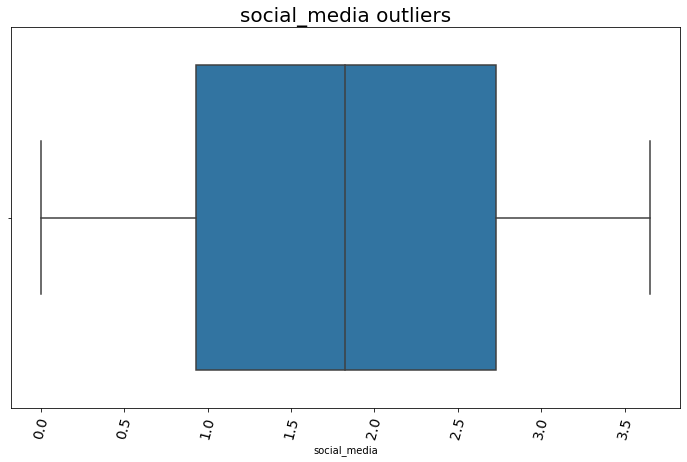

In [53]:
plot_box(quntitative_df, "social_media", "social_media outliers")

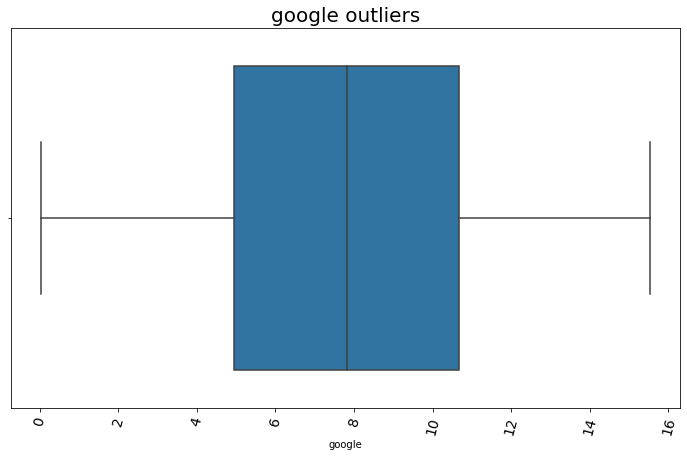

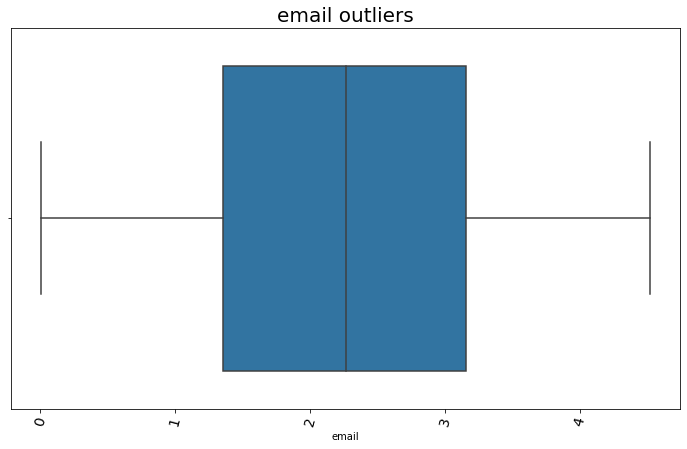

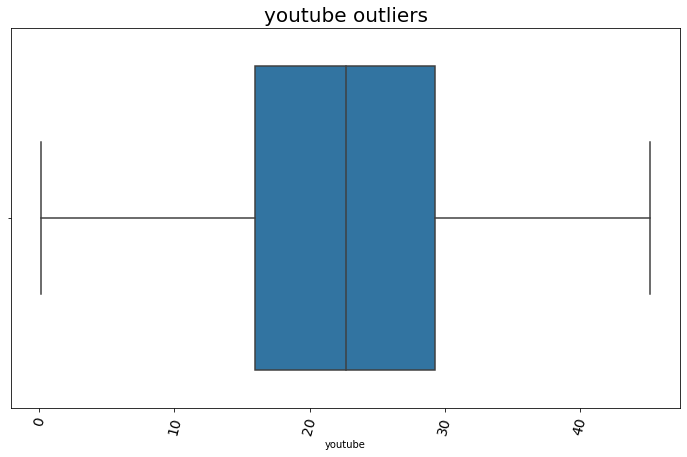

In [54]:
plot_box(quntitative_df, "google", "google outliers")

plot_box(quntitative_df, "email", "email outliers")

plot_box(quntitative_df, "youtube", "youtube outliers")



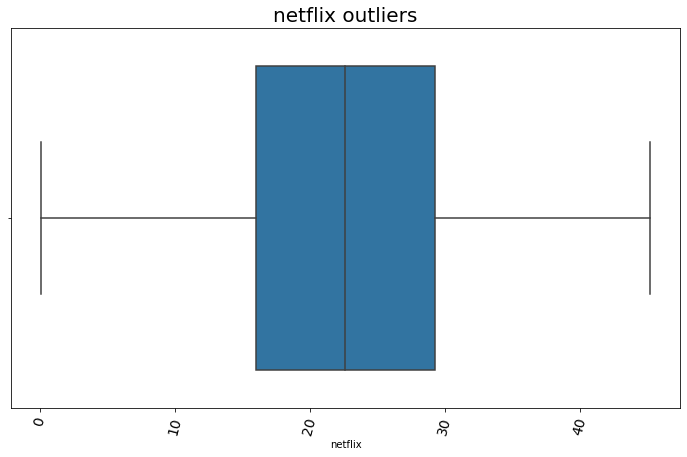

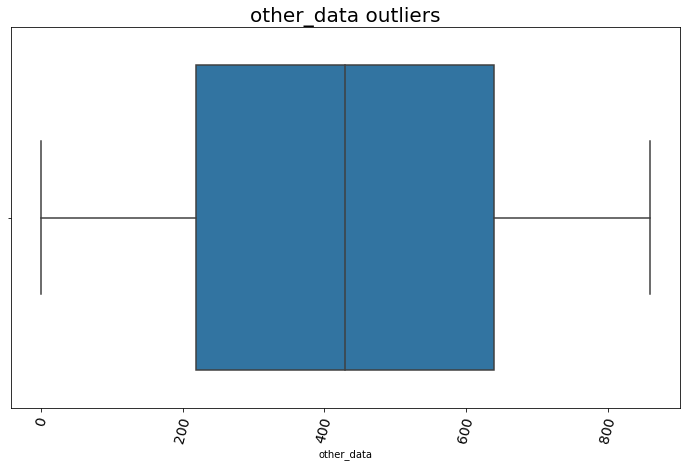

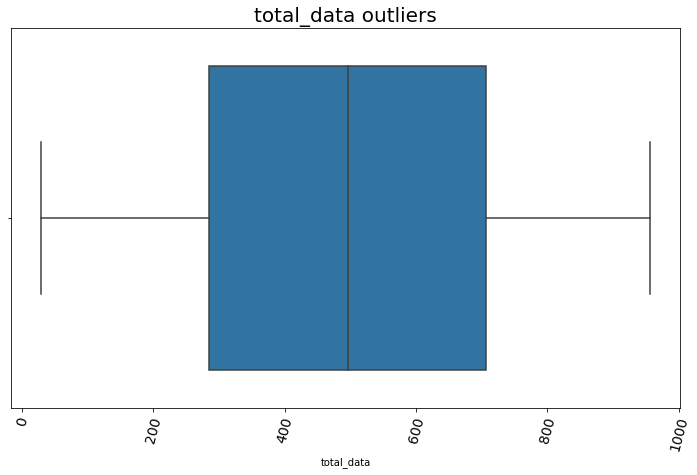

In [55]:

plot_box(quntitative_df, "netflix", "netflix outliers")

plot_box(quntitative_df, "other_data", "other_data outliers")

plot_box(quntitative_df, "total_data", "total_data outliers")


***As you can see from the above the applications data has no significant outliers***

### Outlier detection for duration

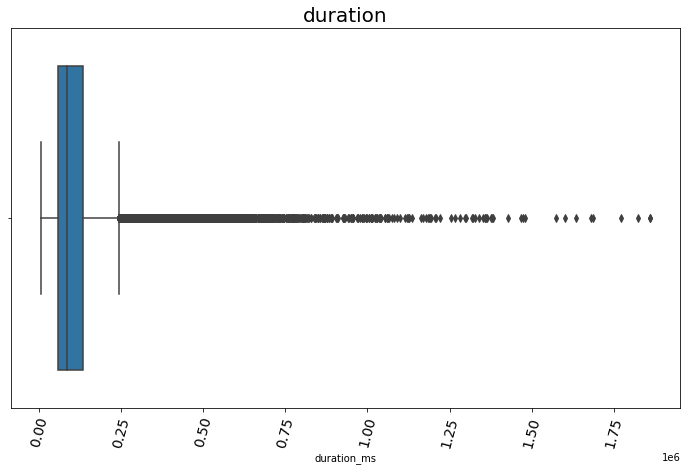

In [56]:
plot_box(quntitative_df, "duration_ms", "duration")


***duration_ms has outliers so we need to handle that***

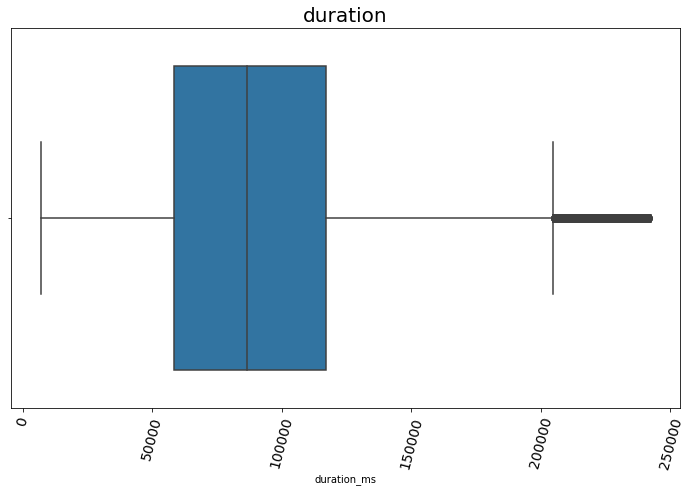

In [57]:

quntitative_df['duration_ms'] = np.where(quntitative_df['duration_ms'] > quntitative_df['duration_ms'].quantile(0.95),
                                         quntitative_df['duration_ms'].mode(),quntitative_df['duration_ms'])
plot_box(quntitative_df, "duration_ms", "duration")


    

<Figure size 648x504 with 0 Axes>

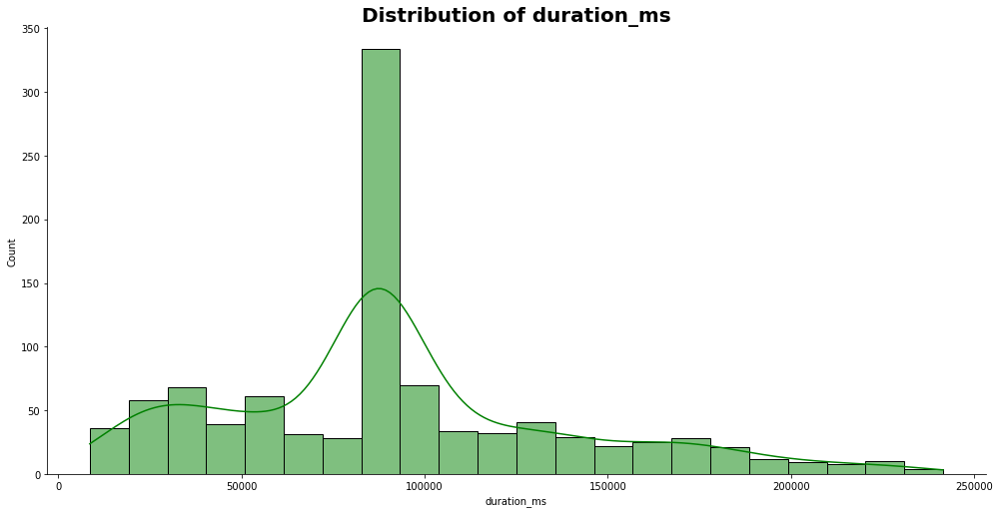

In [58]:
plot_hist(quntitative_df.sample(1000), 'duration_ms', color='green')

<Figure size 648x504 with 0 Axes>

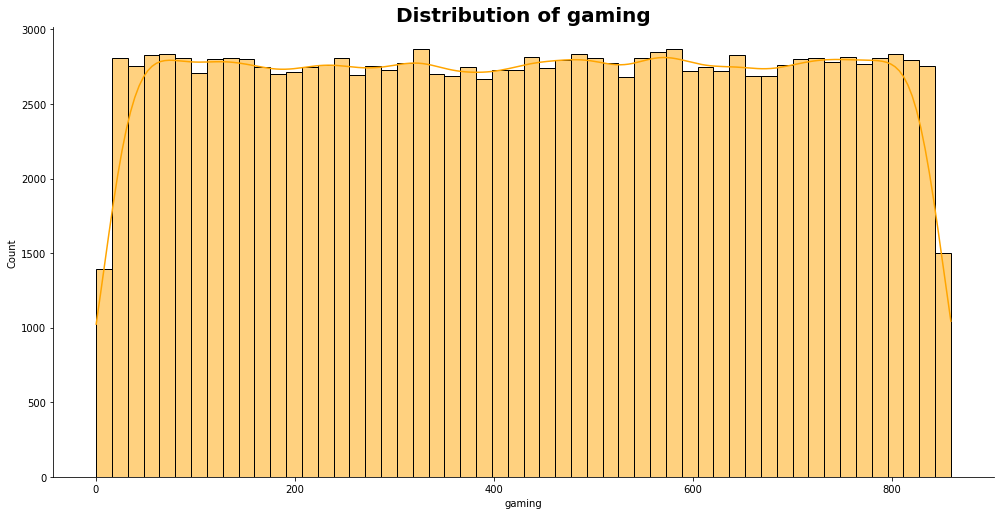

<Figure size 648x504 with 0 Axes>

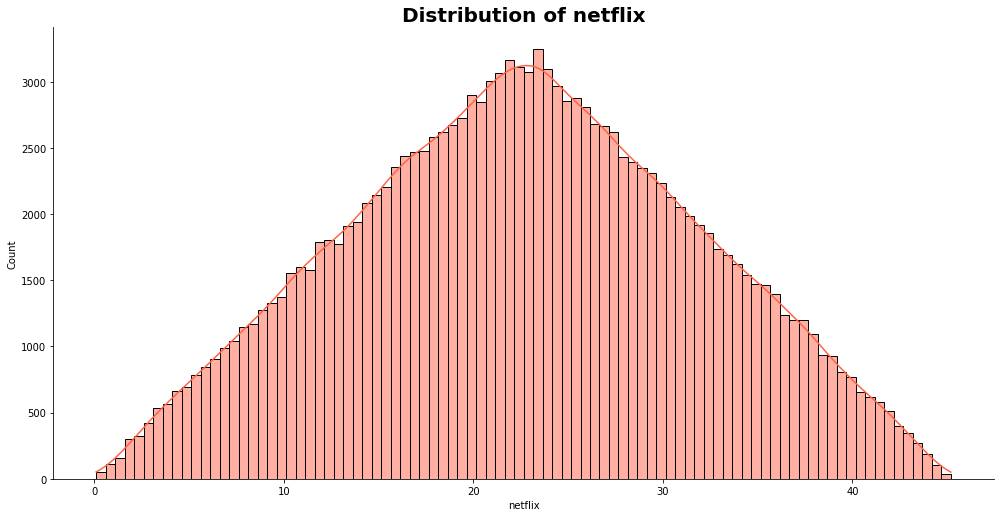

<Figure size 648x504 with 0 Axes>

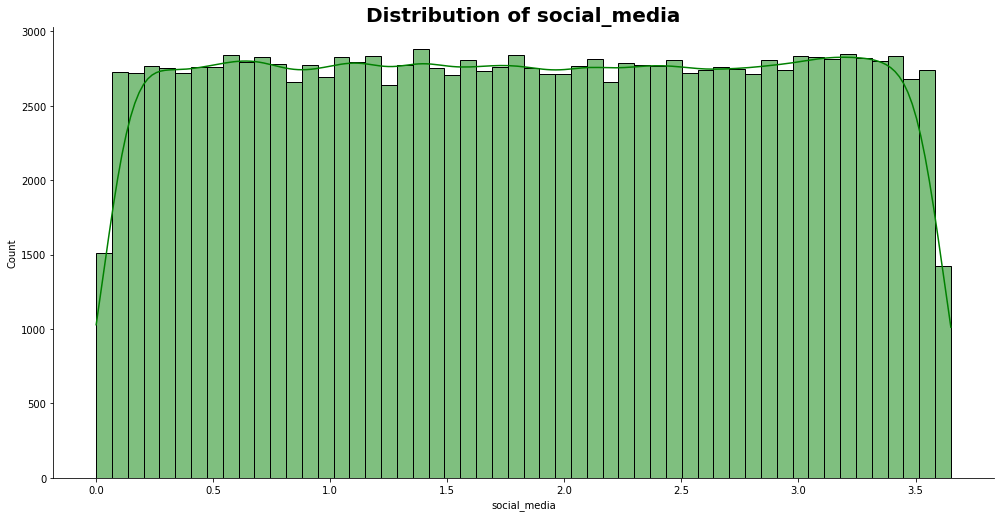

In [59]:
plot_hist(quntitative_df, 'gaming', color='orange')

plot_hist(quntitative_df, 'netflix', color='tomato')

plot_hist(quntitative_df, 'social_media', color='green')




<Figure size 648x504 with 0 Axes>

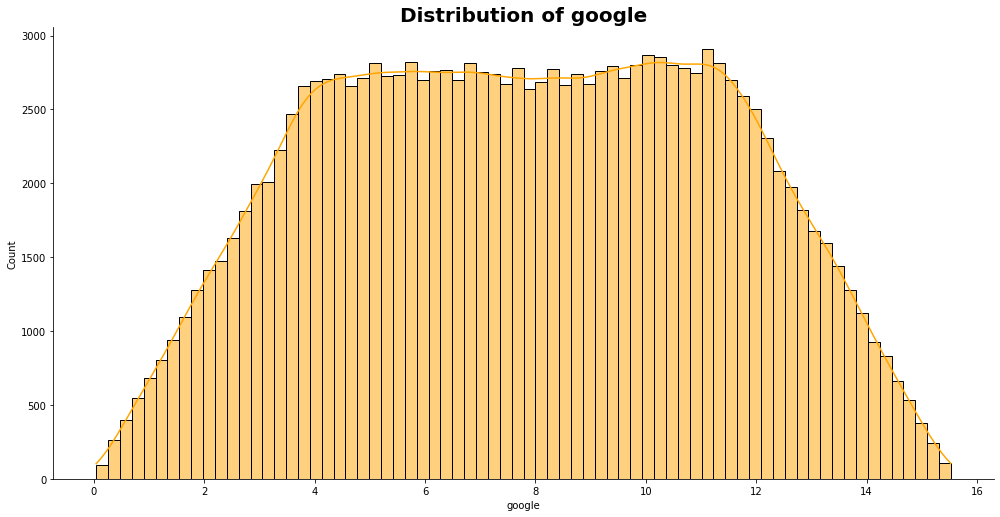

<Figure size 648x504 with 0 Axes>

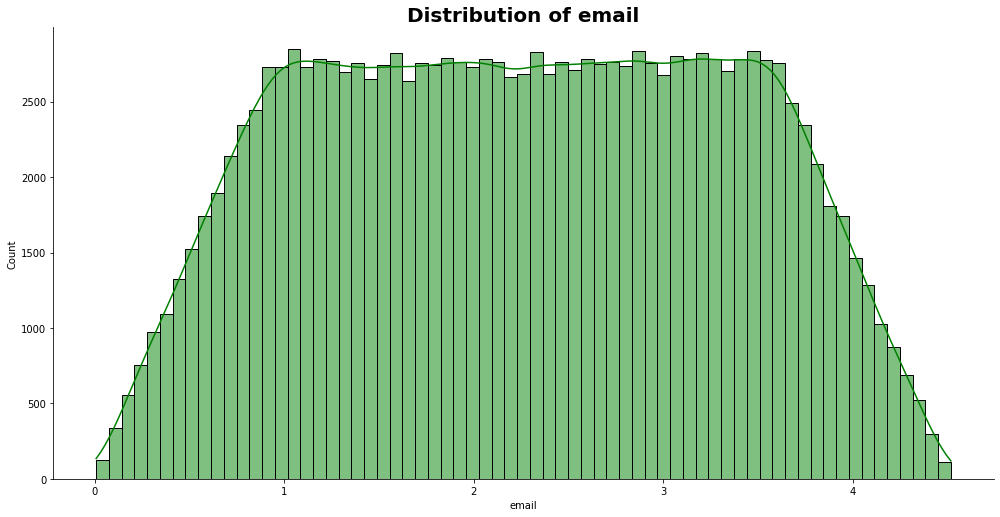

<Figure size 648x504 with 0 Axes>

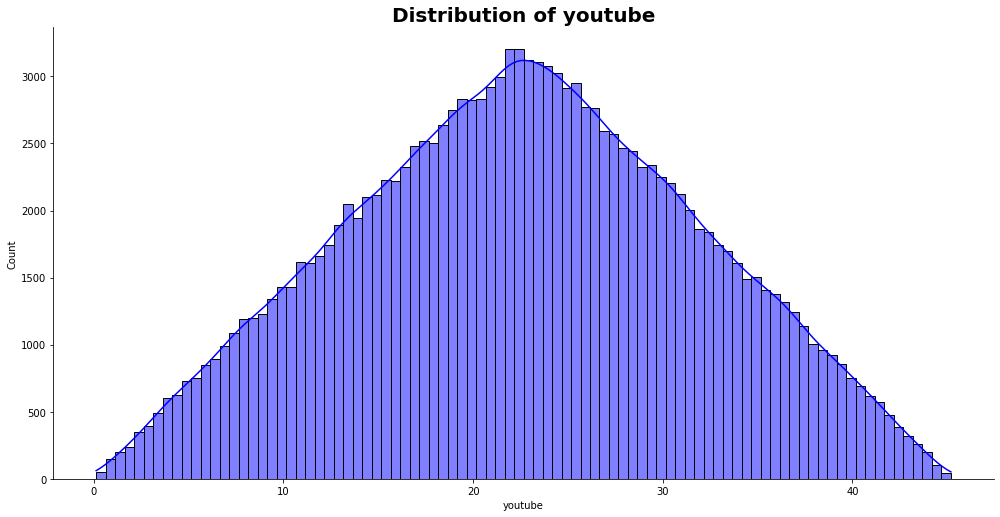

In [60]:
plot_hist(quntitative_df, 'google', color='orange')

plot_hist(quntitative_df, 'email', color='green')

plot_hist(quntitative_df, 'youtube', color='blue')

### Multi varent analysis

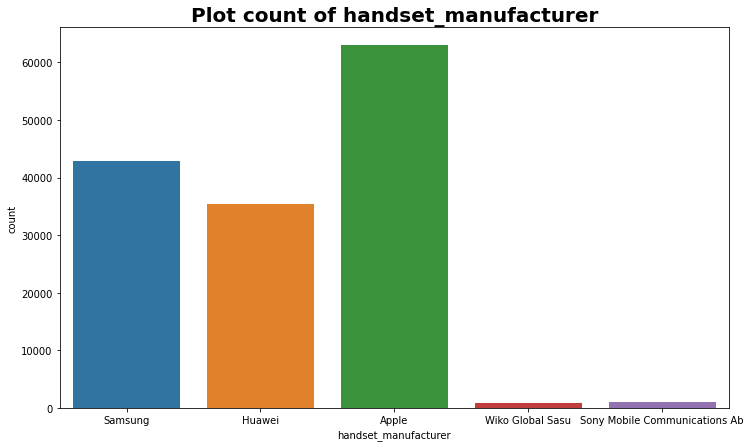

In [61]:
top_manfacturers = overViewAnal.top_manufacturer(top=5).index[:5].to_list()
filter_row = explore_feature_df['handset_manufacturer'].isin(top_manfacturers)

count_df = explore_feature_df[filter_row]
plot_count(count_df, 'handset_manufacturer')



# plot_count(explore_feature_df[explore_feature_df['handset_manufacturer'].isin(overViewAnal.top_manufacturer(top=3)._to_list())], 'handset_manufacturer')



 Total volume data used by each application per user

In [62]:
total_data = explore_feature_df[['msisdn', 'social_media', 'google', 'email', 'youtube', 'netflix',
                                 'gaming',  'other_data', 'total_data', 'handset_manufacturer']]
total_data_agg = total_data.groupby('msisdn').sum()
total_data_agg


,social_media,google,email,youtube,netflix,gaming,other_data,total_data
msisdn,,,,,,,,
33601001722.000000,2.232135,4.389005,1.331362,21.624548,27.180981,812.458661,386.570872,878.690574
33601001754.000000,2.660565,5.334863,3.307781,12.432223,11.221763,119.750078,281.710071,156.859643
33601002511.000000,3.195623,3.443126,3.205380,21.333570,19.353900,538.827713,501.693672,595.966483
33601007832.000000,0.280294,9.678493,2.284670,6.977321,1.942092,391.126127,35.279702,422.320698
33601008617.000000,2.912542,18.499616,3.305469,41.533002,49.201724,1314.797820,804.804484,1457.410944
...,...,...,...,...,...,...,...,...
33789967113.000000,1.413370,9.892882,3.396607,28.226479,30.370302,134.815919,408.107210,208.123067
33789980299.000000,4.250312,10.246473,5.315327,38.012812,51.950311,972.344996,1075.140407,1094.693386
33789996170.000000,0.300183,7.531269,1.006915,26.647843,14.902538,660.361359,295.282817,714.641641


### Bivariate Analysis b/n total_data and each application


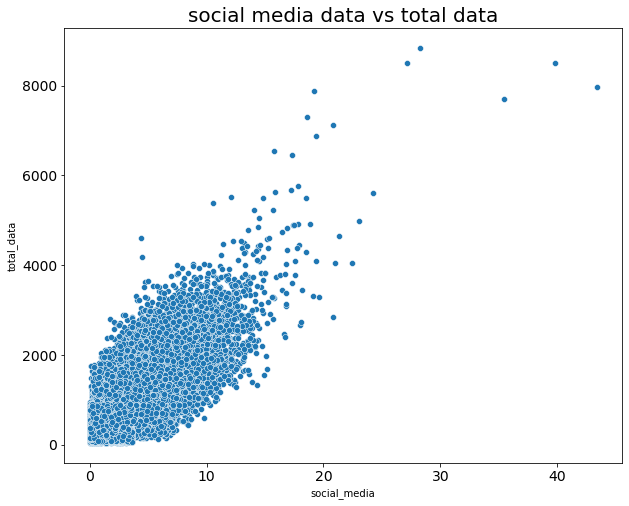

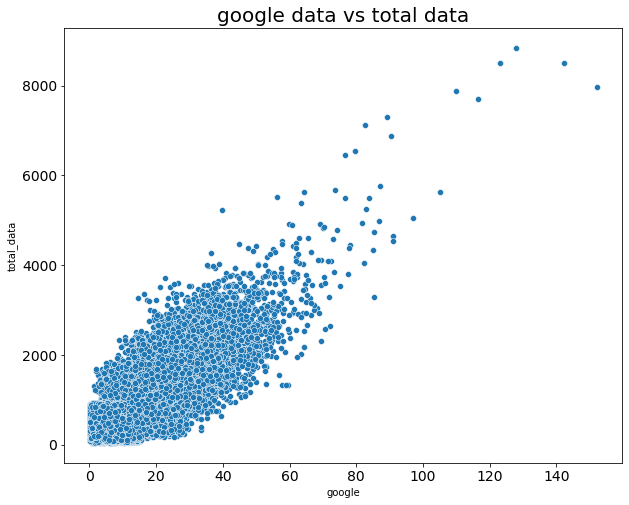

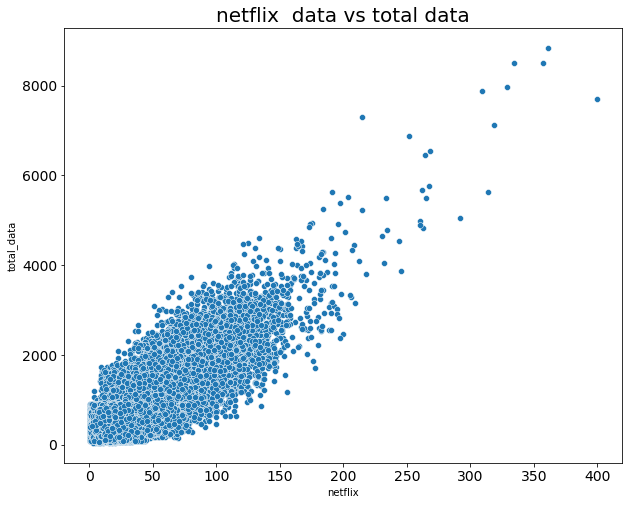

In [63]:
plot_scatter(total_data_agg, 'social_media', 'total_data', 'social media data vs total data',  None,  None)

plot_scatter(total_data_agg, 'google', 'total_data', 'google data vs total data',  None,  None)

plot_scatter(total_data_agg, 'netflix', 'total_data', 'netflix  data vs total data',  None,  None)



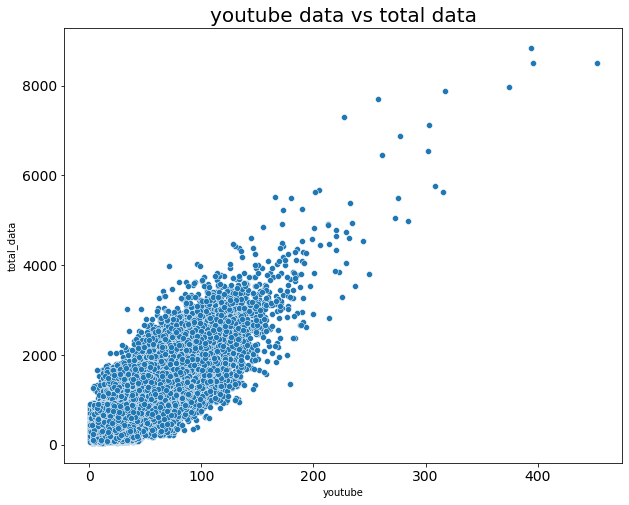

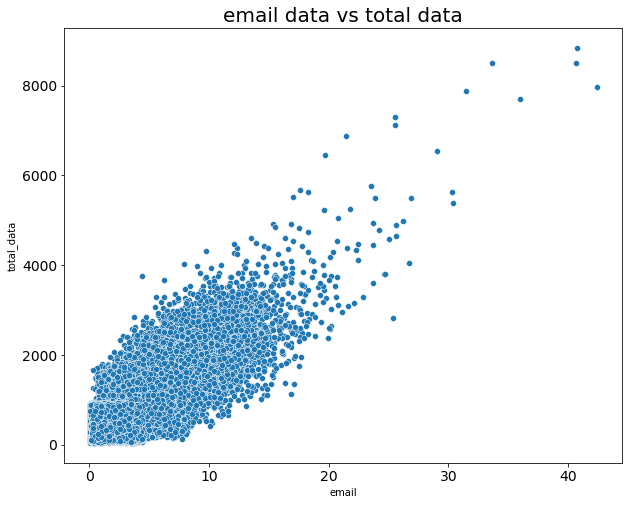

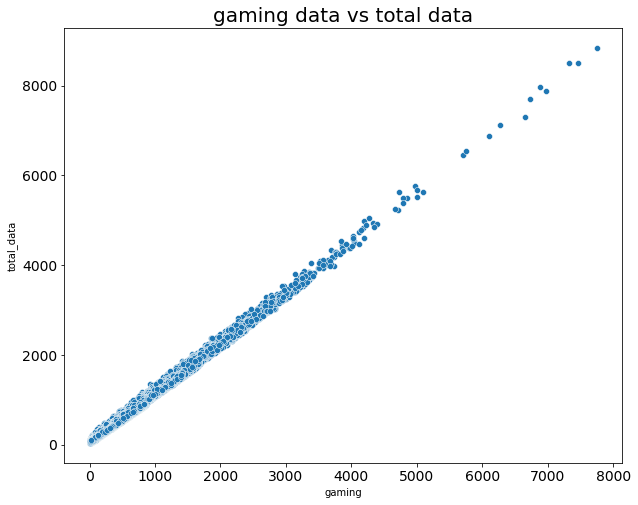

In [64]:
plot_scatter(total_data_agg, 'youtube', 'total_data', 'youtube data vs total data',  None,  None)
plot_scatter(total_data_agg, 'email', 'total_data', 'email data vs total data',  None,  None)
plot_scatter(total_data_agg, 'gaming', 'total_data', 'gaming data vs total data',  None,  None)

In [65]:

total_data = explore_feature_df[['social_media', 'google', 'email', 'youtube', 'netflix',
                                 'gaming',  'other_data', 'total_data']]






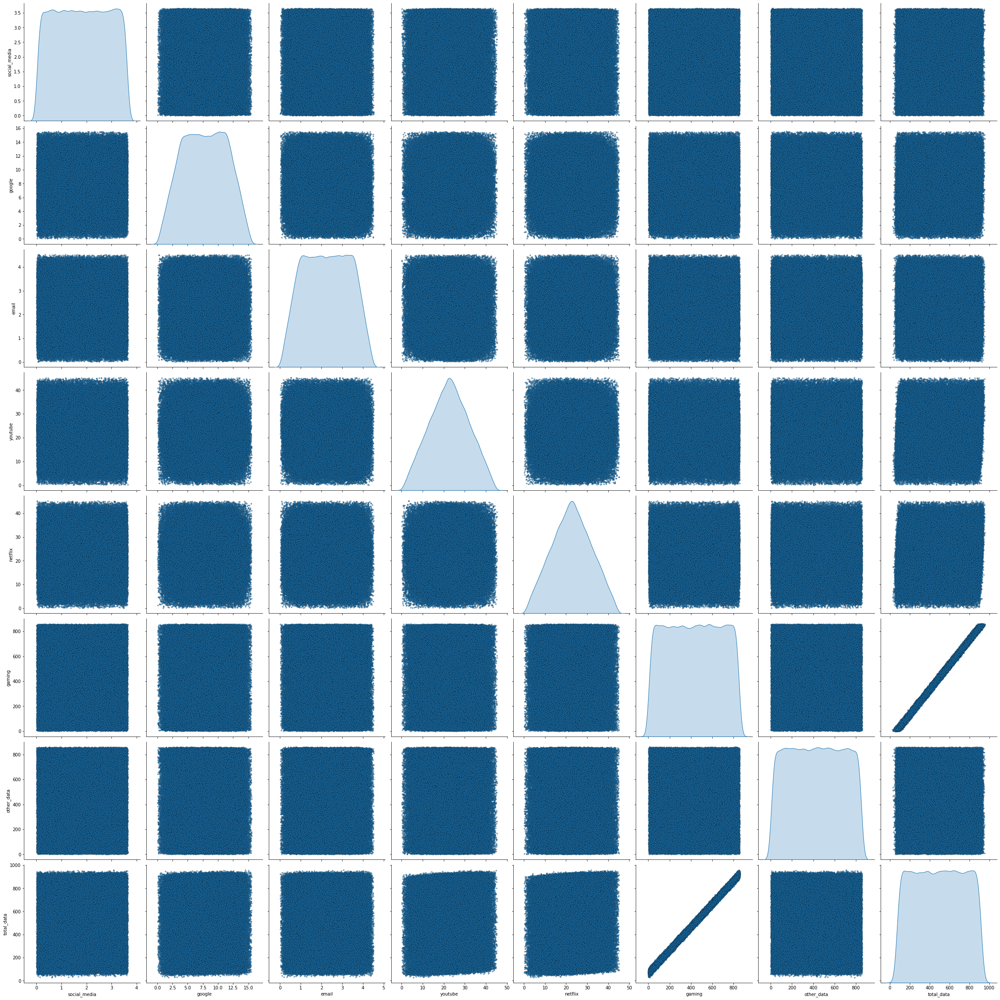

In [66]:
sns.color_palette("crest", as_cmap=True)
sns.pairplot(total_data, diag_kind = 'kde',
             plot_kws = {'alpha': 0.6, 's': 10, 'edgecolor': 'k'},
             height=4)

### Multivarent Analysis for categorical data


In [67]:
social_media_total = total_data.sum()[0]
google_total = total_data.sum()[1]
email_total = total_data.sum()[2]
youtube_total = total_data.sum()[3]
netflix_total = total_data.sum()[4]
gaming_total = total_data.sum()[5]
other_data = total_data.sum()[6]


app_total_count_df = pd.DataFrame(columns=['app', 'total'])
app_total_count_df['app'] = ['social_media', 'google', 'email', 'youtube', 'netflix', 'gaming', 'other_data']

app_total_count_df['total'] = [social_media_total, google_total, email_total, youtube_total, netflix_total, gaming_total,  other_data]
app_total_count_df


,app,total
0,social_media,268478.589410
1,google,1146921.653914
2,email,331838.236748
3,youtube,3325904.550858
4,netflix,3324049.323727
5,gaming,63215294.882199
6,other_data,63055410.744638


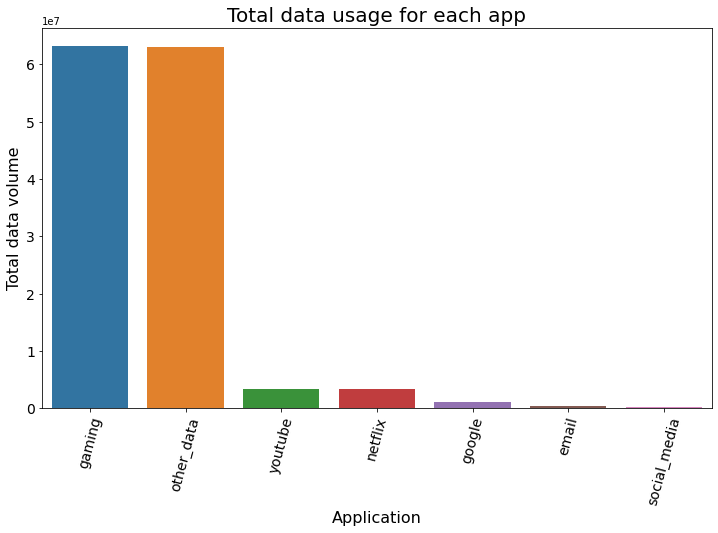

In [68]:
plot_bar(app_total_count_df.sort_values(by=['total'], ascending = False), x_col='app', y_col='total', title="Total data usage for each app", xlabel="Application", ylabel="Total data volume")


In [69]:

px.pie(app_total_count_df, values="total",
                     names="app", width=700, height=500)
    

### Variable transformations

In [70]:
from sklearn.preprocessing import MinMaxScaler

# I scaled the duration by dividing it to 1000 to easily
# compare it with total data which has already been converted to megabytes

scaled_explore_feature_df = explore_feature_df[['msisdn', 'total_data', 'duration_ms']]

scaled_explore_feature_df['duration_ms'] = explore_feature_df['duration_ms']/1000
scaled_explore_feature_df = scaled_explore_feature_df.rename(columns={'duration_ms': 'duration'})

scaled_explore_feature_df_agg = scaled_explore_feature_df.groupby('msisdn').agg({'duration':'sum', 'total_data': 'sum'})

deciles = pd.qcut(scaled_explore_feature_df_agg['duration'], 5, labels=["1st_decile", "2nd_decile",
                                                      "3rd_decile", "4th_decile",
                                                      "5th_decile"])



explore_feature_df_with_decile = scaled_explore_feature_df_agg.copy()

explore_feature_df_with_decile['decile'] = deciles

explore_feature_df_with_decile_agg = explore_feature_df_with_decile.groupby('decile').agg({'total_data': 'sum',
                                                                                           'duration': 'sum'})
explore_feature_df_with_decile_agg




,total_data,duration
decile,,
1st_decile,11430240.255750,647473.886000
2nd_decile,12271273.967186,1778391.158000
3rd_decile,11566628.145365,2130274.650000
4th_decile,13774338.350891,3414760.017000
5th_decile,23783750.217140,7486422.650000


<Figure size 720x504 with 0 Axes>

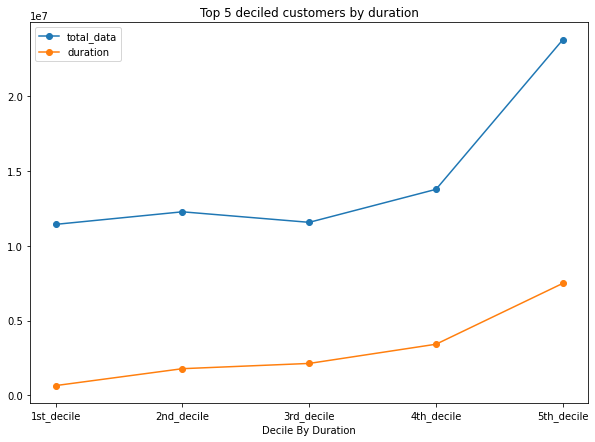

In [71]:



plt.figure(figsize=(10,7))
explore_feature_df_with_decile_agg.plot(linestyle='-', marker='o', figsize=(10,7), title='Top 5 deciled customers by duration').set_xlabel("Decile By Duration")
plt.xticks(np.arange(len(explore_feature_df_with_decile_agg.index)), explore_feature_df_with_decile_agg.index)

plt.show()

We can see that the total_data voume increases as duration increases



Total_data_volume seems to be direclty proportional to duration


We can also observe that after the 4th decile both duration and total data increased at much higher rate than before

### Correlation Analysis for each application

In [72]:
total_data_2 = explore_feature_df[['social_media', 'google', 'email', 'youtube', 'netflix',
                                 'gaming',  'other_data']]

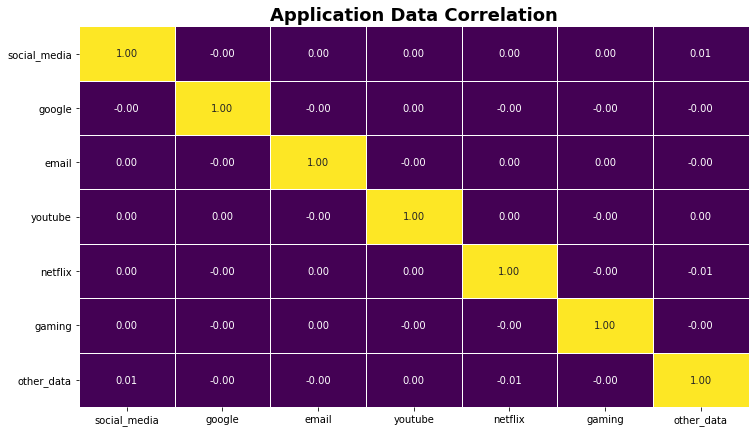

,social_media,google,email,youtube,netflix,gaming,other_data
social_media,1.000000,-0.001919,0.004188,0.000580,0.001386,0.001901,0.005540
google,-0.001919,1.000000,-0.000049,0.002178,-0.002013,-0.000803,-0.001290
email,0.004188,-0.000049,1.000000,-0.003438,0.001499,0.000065,-0.000778
youtube,0.000580,0.002178,-0.003438,1.000000,0.003611,-0.003670,0.003235
netflix,0.001386,-0.002013,0.001499,0.003611,1.000000,-0.003532,-0.007927
gaming,0.001901,-0.000803,0.000065,-0.003670,-0.003532,1.000000,-0.002821
other_data,0.005540,-0.001290,-0.000778,0.003235,-0.007927,-0.002821,1.000000


In [73]:
data_correlation = total_data_2.corr()
plot_heatmap(data_correlation, 'Application Data Correlation')
data_correlation


We can see that each applcation data volume has no significant coorelation


This can suggest that each application data is as important as the other